# Transaction Fraud Detection

# Introduction
Transaction fraud detection is a crucial process in identifying and preventing unauthorized or fraudulent financial activities. It leverages machine learning, rule-based systems, and anomaly detection techniques to analyze transaction patterns in real time. By detecting suspicious behavior, businesses can minimize financial losses and enhance security for customers.

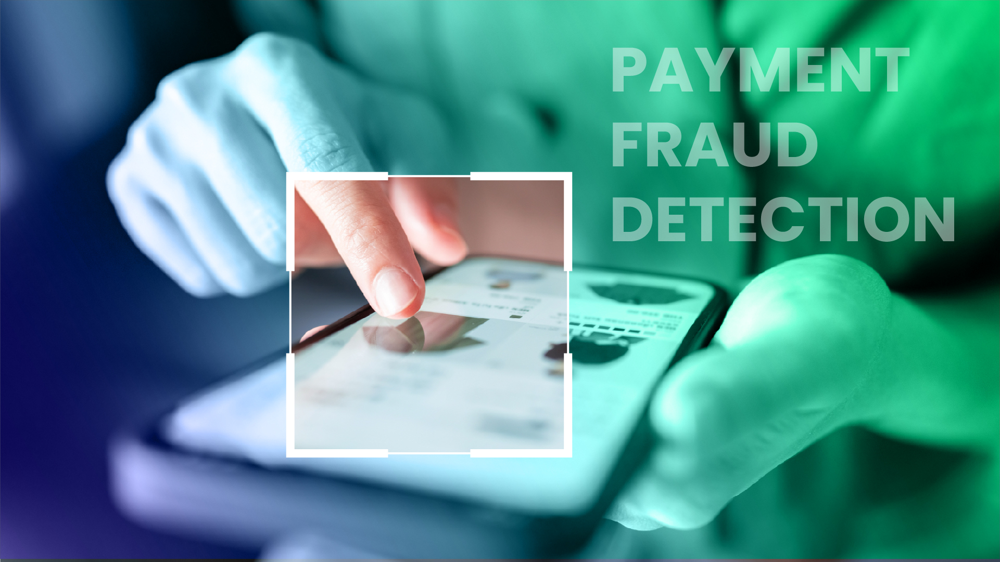

# Problem statement 
With the increasing volume of digital transactions, financial institutions face significant challenges in identifying and preventing fraudulent activities. Traditional rule-based fraud detection systems are often ineffective due to the evolving nature of fraud tactics. The goal of this project is to develop a robust fraud detection system with the help of machine learning that can analyze transaction patterns and identify potentially fraudulent transactions in real time.

# Project Aim :
## 1.Identify and Prevent Fraudulent Transactions – 
Develop a system that accurately detects fraudulent activities while minimizing false positives to ensure smooth financial transactions.

## 2.Enhance Security Using AI & Machine Learning – 
Utilize advanced algorithms to analyze transaction patterns, detect anomalies, and adapt to evolving fraud techniques in real time.

## 3.Improve Financial Safety & User Trust – 
Reduce financial losses for institutions and customers by implementing a reliable fraud detection mechanism that safeguards digital transactions.

# Importing required libraries 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv('transaction fraud.csv')
df

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Timestamp,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,...,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
0,TXN_33553,USER_1834,39.79,POS,2023-08-14 19:30:00,93213.17,Laptop,Sydney,Travel,0,...,7,437.63,3,Amex,65,883.17,Biometric,0.8494,0,0
1,TXN_9427,USER_7875,1.19,Bank Transfer,2023-06-07 04:01:00,75725.25,Mobile,New York,Clothing,0,...,13,478.76,4,Mastercard,186,2203.36,Password,0.0959,0,1
2,TXN_199,USER_2734,28.96,Online,2023-06-20 15:25:00,1588.96,Tablet,Mumbai,Restaurants,0,...,14,50.01,4,Visa,226,1909.29,Biometric,0.8400,0,1
3,TXN_12447,USER_2617,254.32,ATM Withdrawal,2023-12-07 00:31:00,76807.20,Tablet,New York,Clothing,0,...,8,182.48,4,Visa,76,1311.86,OTP,0.7935,0,1
4,TXN_39489,USER_2014,31.28,POS,2023-11-11 23:44:00,92354.66,Mobile,Mumbai,Electronics,0,...,14,328.69,4,Mastercard,140,966.98,Password,0.3819,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,TXN_11284,USER_4796,45.05,Online,2023-01-29 18:38:00,76960.11,Mobile,Tokyo,Clothing,0,...,2,389.00,3,Amex,98,1537.54,PIN,0.1493,1,0
49996,TXN_44732,USER_1171,126.15,POS,2023-05-09 08:55:00,28791.75,Mobile,Tokyo,Clothing,0,...,13,434.95,4,Visa,93,2555.72,Biometric,0.3653,0,1
49997,TXN_38158,USER_2510,72.02,Online,2023-01-30 19:32:00,29916.41,Laptop,Mumbai,Clothing,0,...,1,369.15,2,Visa,114,4686.59,Biometric,0.5195,0,0
49998,TXN_860,USER_2248,64.89,Bank Transfer,2023-03-09 19:47:00,67895.67,Mobile,Tokyo,Electronics,0,...,13,242.29,4,Discover,72,4886.92,Biometric,0.7063,0,1


## Transaction_ID:	Unique identifier for each transaction
## User_ID:	Unique identifier for the user
## Transaction_Amount:	Amount of money involved in the transaction
## Transaction_Type:	Type of transaction (Online, In-Store, ATM, etc.)
## Timestamp:	Date and time of the transaction
## Account_Balance:	User's current account balance before the transaction
## Device_Type	:Type of device used (Mobile, Desktop, etc.)
## Location:	Geographical location of the transaction
## Merchant_Category:	Type of merchant (Retail, Food, Travel, etc.)
## IP_Address_Flag:	Whether the IP address was flagged as suspicious (0 or 1)
## Previous_Fraudulent_Activity:	Number of past fraudulent activities by the user
## Daily_Transaction_Count:	Number of transactions made by the user that day
## Avg_Transaction_Amount_7d:	User's average transaction amount in the past 7 days
## Failed_Transaction_Count_7d:	Count of failed transactions in the past 7 days
## Card_Type:	Type of payment card used (Credit, Debit, Prepaid, etc.)
## Card_Age:	Age of the card in months
## Transaction_Distance:	Distance between the user's usual location and transaction location
## Authentication_Method:	How the user authenticated (PIN, Biometric, etc.)
## Risk_Score:	Fraud risk score computed for the transaction
## Is_Weekend:	Whether the transaction occurred on a weekend (0 or 1)
## Fraud_Label:	Target variable (0 = Not Fraud, 1 = Fraud)

# Basic Checks 

In [3]:
df.shape

(50000, 21)

### There are 50000 rows and 21 columns 

In [4]:
df.head()

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Timestamp,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,...,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
0,TXN_33553,USER_1834,39.79,POS,2023-08-14 19:30:00,93213.17,Laptop,Sydney,Travel,0,...,7,437.63,3,Amex,65,883.17,Biometric,0.8494,0,0
1,TXN_9427,USER_7875,1.19,Bank Transfer,2023-06-07 04:01:00,75725.25,Mobile,New York,Clothing,0,...,13,478.76,4,Mastercard,186,2203.36,Password,0.0959,0,1
2,TXN_199,USER_2734,28.96,Online,2023-06-20 15:25:00,1588.96,Tablet,Mumbai,Restaurants,0,...,14,50.01,4,Visa,226,1909.29,Biometric,0.8400,0,1
3,TXN_12447,USER_2617,254.32,ATM Withdrawal,2023-12-07 00:31:00,76807.20,Tablet,New York,Clothing,0,...,8,182.48,4,Visa,76,1311.86,OTP,0.7935,0,1
4,TXN_39489,USER_2014,31.28,POS,2023-11-11 23:44:00,92354.66,Mobile,Mumbai,Electronics,0,...,14,328.69,4,Mastercard,140,966.98,Password,0.3819,1,1


In [5]:
df.tail()

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Timestamp,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,...,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
49995,TXN_11284,USER_4796,45.05,Online,2023-01-29 18:38:00,76960.11,Mobile,Tokyo,Clothing,0,...,2,389.00,3,Amex,98,1537.54,PIN,0.1493,1,0
49996,TXN_44732,USER_1171,126.15,POS,2023-05-09 08:55:00,28791.75,Mobile,Tokyo,Clothing,0,...,13,434.95,4,Visa,93,2555.72,Biometric,0.3653,0,1
49997,TXN_38158,USER_2510,72.02,Online,2023-01-30 19:32:00,29916.41,Laptop,Mumbai,Clothing,0,...,1,369.15,2,Visa,114,4686.59,Biometric,0.5195,0,0
49998,TXN_860,USER_2248,64.89,Bank Transfer,2023-03-09 19:47:00,67895.67,Mobile,Tokyo,Electronics,0,...,13,242.29,4,Discover,72,4886.92,Biometric,0.7063,0,1
49999,TXN_15795,USER_6529,13.00,Bank Transfer,2023-08-19 23:57:00,7668.82,Tablet,London,Restaurants,0,...,5,273.78,1,Mastercard,154,1568.95,OTP,0.8938,0,1


In [6]:
df.columns

Index(['Transaction_ID', 'User_ID', 'Transaction_Amount', 'Transaction_Type',
       'Timestamp', 'Account_Balance', 'Device_Type', 'Location',
       'Merchant_Category', 'IP_Address_Flag', 'Previous_Fraudulent_Activity',
       'Daily_Transaction_Count', 'Avg_Transaction_Amount_7d',
       'Failed_Transaction_Count_7d', 'Card_Type', 'Card_Age',
       'Transaction_Distance', 'Authentication_Method', 'Risk_Score',
       'Is_Weekend', 'Fraud_Label'],
      dtype='object')

In [7]:
df.dtypes

Transaction_ID                   object
User_ID                          object
Transaction_Amount              float64
Transaction_Type                 object
Timestamp                        object
Account_Balance                 float64
Device_Type                      object
Location                         object
Merchant_Category                object
IP_Address_Flag                   int64
Previous_Fraudulent_Activity      int64
Daily_Transaction_Count           int64
Avg_Transaction_Amount_7d       float64
Failed_Transaction_Count_7d       int64
Card_Type                        object
Card_Age                          int64
Transaction_Distance            float64
Authentication_Method            object
Risk_Score                      float64
Is_Weekend                        int64
Fraud_Label                       int64
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Transaction_ID                50000 non-null  object 
 1   User_ID                       50000 non-null  object 
 2   Transaction_Amount            50000 non-null  float64
 3   Transaction_Type              50000 non-null  object 
 4   Timestamp                     50000 non-null  object 
 5   Account_Balance               50000 non-null  float64
 6   Device_Type                   50000 non-null  object 
 7   Location                      50000 non-null  object 
 8   Merchant_Category             50000 non-null  object 
 9   IP_Address_Flag               50000 non-null  int64  
 10  Previous_Fraudulent_Activity  50000 non-null  int64  
 11  Daily_Transaction_Count       50000 non-null  int64  
 12  Avg_Transaction_Amount_7d     50000 non-null  float64
 13  F

In [9]:
num_data=df.select_dtypes(include=["float64","int64"])
print("numerical colums",num_data.columns)


numerical colums Index(['Transaction_Amount', 'Account_Balance', 'IP_Address_Flag',
       'Previous_Fraudulent_Activity', 'Daily_Transaction_Count',
       'Avg_Transaction_Amount_7d', 'Failed_Transaction_Count_7d', 'Card_Age',
       'Transaction_Distance', 'Risk_Score', 'Is_Weekend', 'Fraud_Label'],
      dtype='object')


In [10]:
cat_data=df.select_dtypes(include=["O"])
print("categorical colums",cat_data.columns)

categorical colums Index(['Transaction_ID', 'User_ID', 'Transaction_Type', 'Timestamp',
       'Device_Type', 'Location', 'Merchant_Category', 'Card_Type',
       'Authentication_Method'],
      dtype='object')


In [11]:
for i in cat_data:
    print(i,df[i].unique())
    print(df[i].value_counts())
    print("**********************")

Transaction_ID ['TXN_33553' 'TXN_9427' 'TXN_199' ... 'TXN_38158' 'TXN_860' 'TXN_15795']
Transaction_ID
TXN_33553    1
TXN_45900    1
TXN_35844    1
TXN_3325     1
TXN_6283     1
            ..
TXN_6725     1
TXN_45945    1
TXN_37967    1
TXN_16019    1
TXN_15795    1
Name: count, Length: 50000, dtype: int64
**********************
User_ID ['USER_1834' 'USER_7875' 'USER_2734' ... 'USER_5657' 'USER_8613'
 'USER_5580']
User_ID
USER_6599    16
USER_3925    16
USER_9998    16
USER_1027    15
USER_5014    15
             ..
USER_5685     1
USER_1806     1
USER_8563     1
USER_5057     1
USER_5580     1
Name: count, Length: 8963, dtype: int64
**********************
Transaction_Type ['POS' 'Bank Transfer' 'Online' 'ATM Withdrawal']
Transaction_Type
POS               12549
Online            12546
ATM Withdrawal    12453
Bank Transfer     12452
Name: count, dtype: int64
**********************
Timestamp ['2023-08-14 19:30:00' '2023-06-07 04:01:00' '2023-06-20 15:25:00' ...
 '2023-01-30 19:32:00' '

In [12]:
df.isnull().sum()

Transaction_ID                  0
User_ID                         0
Transaction_Amount              0
Transaction_Type                0
Timestamp                       0
Account_Balance                 0
Device_Type                     0
Location                        0
Merchant_Category               0
IP_Address_Flag                 0
Previous_Fraudulent_Activity    0
Daily_Transaction_Count         0
Avg_Transaction_Amount_7d       0
Failed_Transaction_Count_7d     0
Card_Type                       0
Card_Age                        0
Transaction_Distance            0
Authentication_Method           0
Risk_Score                      0
Is_Weekend                      0
Fraud_Label                     0
dtype: int64

# EDA

## Univariant Analysis 

In [13]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Bivariate Analysis 

In [14]:
d=df[['Transaction_Type','Device_Type', 'Location', 'Merchant_Category', 'Card_Type','Authentication_Method']]

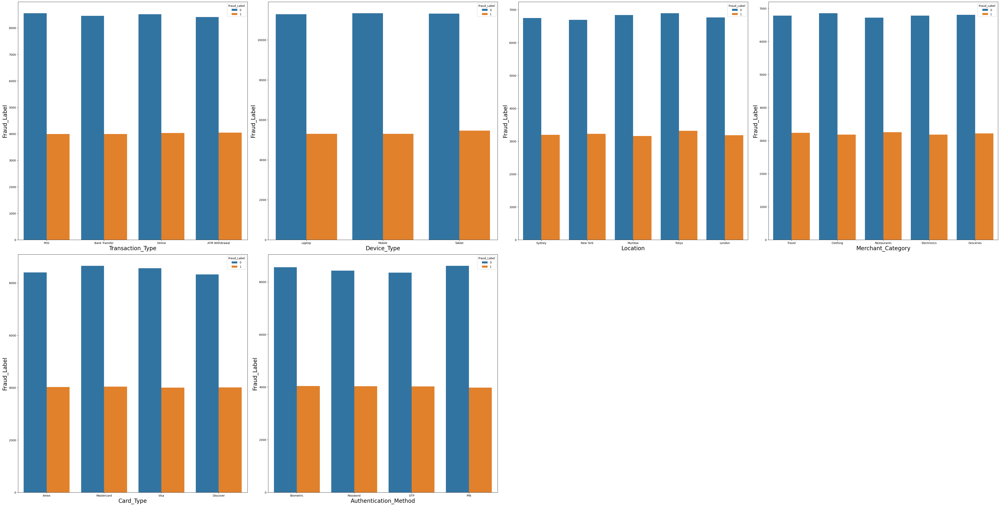

In [15]:
# Plotting how every  categorical feature correlate with the "target"
plt.figure(figsize=(50,50), facecolor='white')
plotnumber = 1
for column in d:
    if plotnumber<=16 :
        ax = plt.subplot(4,4,plotnumber)
        sns.countplot(x=d[column]      
                        ,hue=df.Fraud_Label)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Fraud_Label',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

## Multivariate Analysis

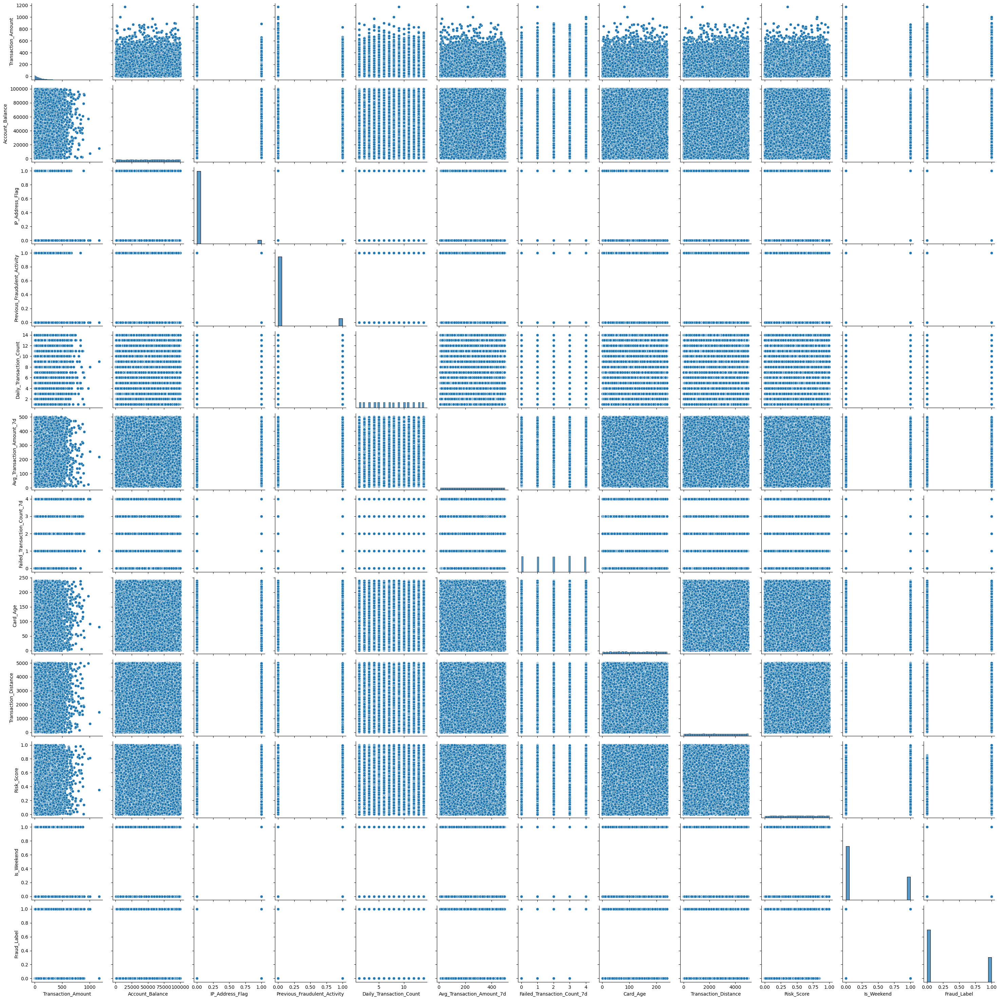

In [16]:
sns.pairplot(df)
plt.show()

# Data Visualization

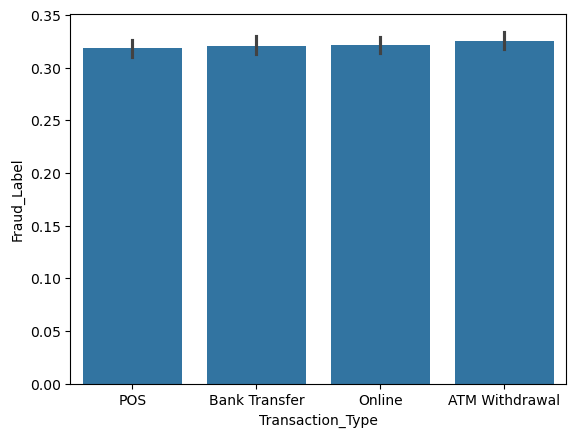

In [18]:
sns.barplot(x=df['Transaction_Type'],y=df['Fraud_Label'])
plt.show()

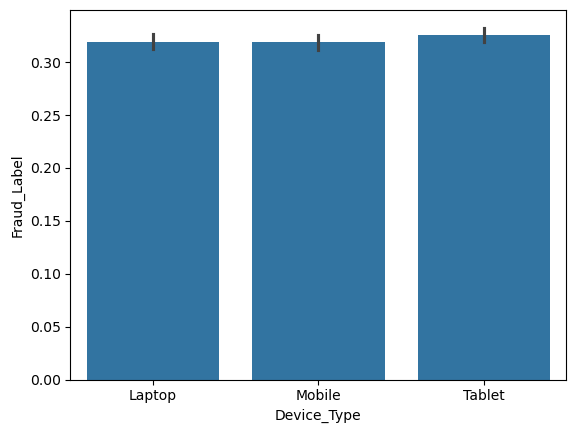

In [19]:
sns.barplot(x=df['Device_Type'],y=df['Fraud_Label'])
plt.show()

In [20]:
num_data.columns

Index(['Transaction_Amount', 'Account_Balance', 'IP_Address_Flag',
       'Previous_Fraudulent_Activity', 'Daily_Transaction_Count',
       'Avg_Transaction_Amount_7d', 'Failed_Transaction_Count_7d', 'Card_Age',
       'Transaction_Distance', 'Risk_Score', 'Is_Weekend', 'Fraud_Label'],
      dtype='object')

In [21]:
cat_data.columns

Index(['Transaction_ID', 'User_ID', 'Transaction_Type', 'Timestamp',
       'Device_Type', 'Location', 'Merchant_Category', 'Card_Type',
       'Authentication_Method'],
      dtype='object')

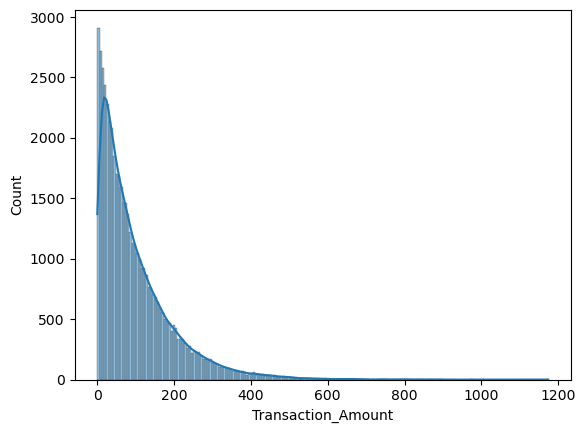

In [22]:
sns.histplot(x=df['Transaction_Amount'],kde=True)
plt.show()

### The graph is right skewed and is positive in nature which shows as the transaction amount increases the count decreases 

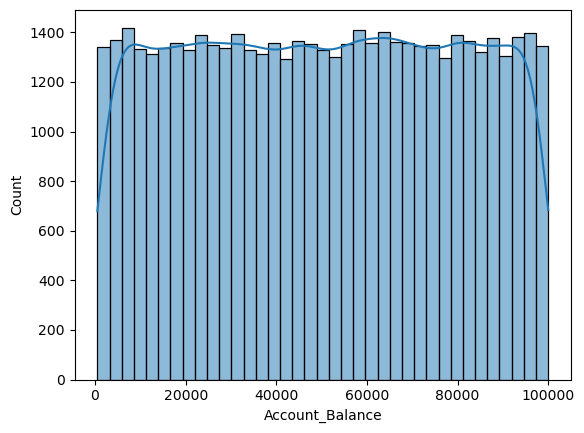

In [23]:
sns.histplot(x=df['Account_Balance'],kde=True)
plt.show()

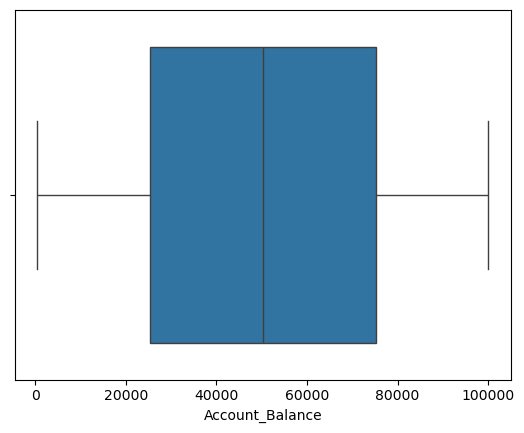

In [24]:
sns.boxplot(x=df['Account_Balance'])
plt.show()

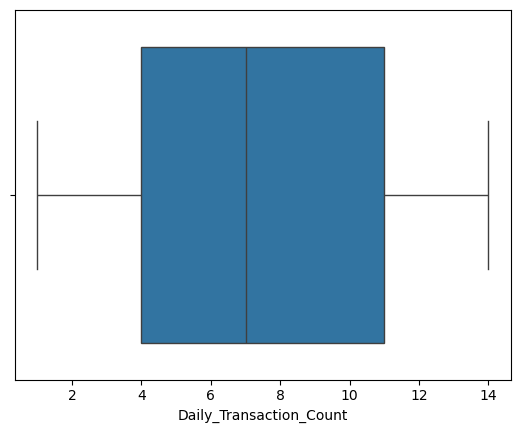

In [25]:
sns.boxplot(x=df['Daily_Transaction_Count'])
plt.show()

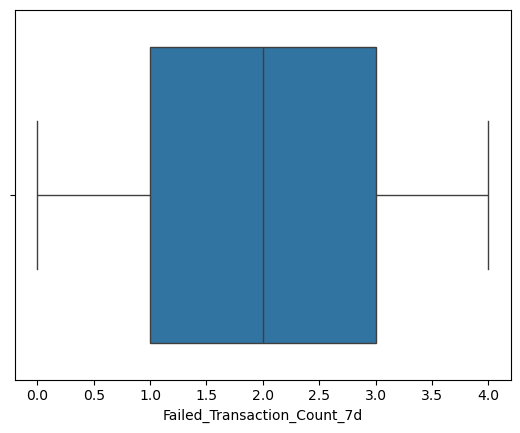

In [26]:
sns.boxplot(x=df['Failed_Transaction_Count_7d'])
plt.show()

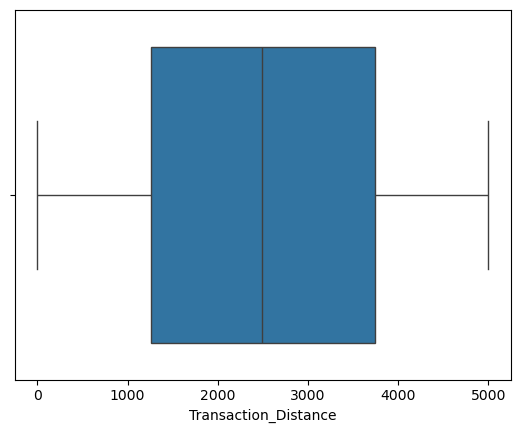

In [27]:
sns.boxplot(x=df['Transaction_Distance'])
plt.show()

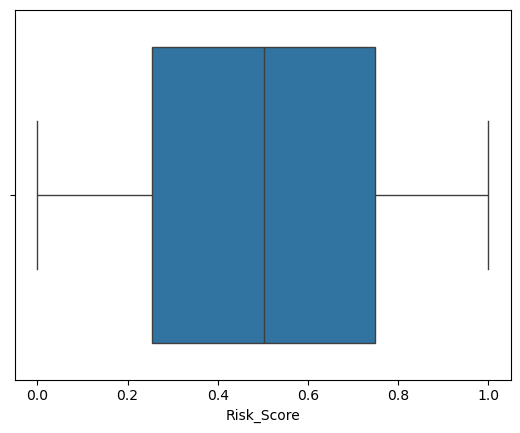

In [28]:
sns.boxplot(x=df['Risk_Score'])
plt.show()

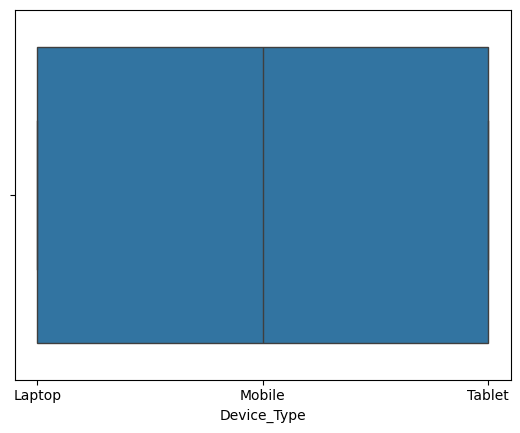

In [29]:
sns.boxplot(x=df['Device_Type'])
plt.show()

### There are no outliers in the above plotted graphs of the respective columns 

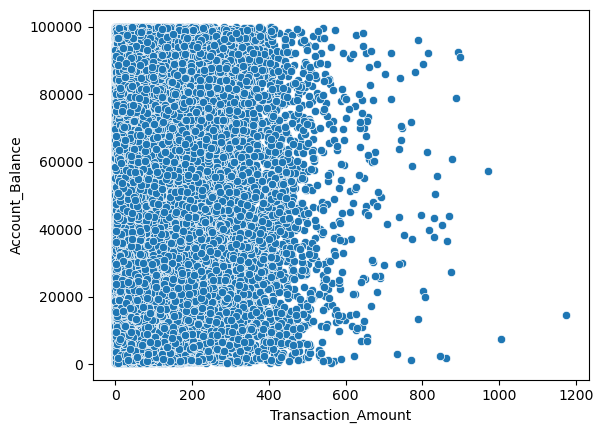

In [30]:
sns.scatterplot(x=df['Transaction_Amount'],y=df['Account_Balance'])
plt.show()

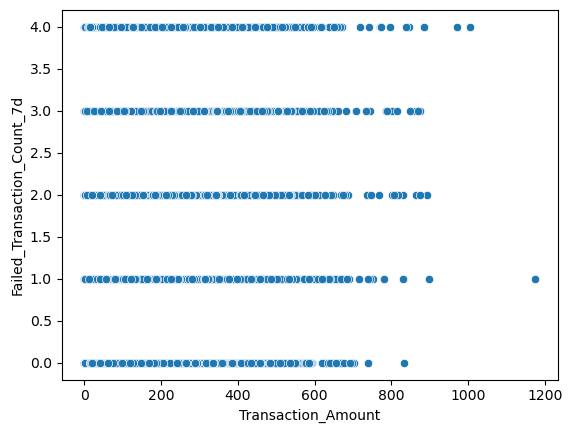

In [31]:
sns.scatterplot(x=df['Transaction_Amount'],y=df['Failed_Transaction_Count_7d'])
plt.show()

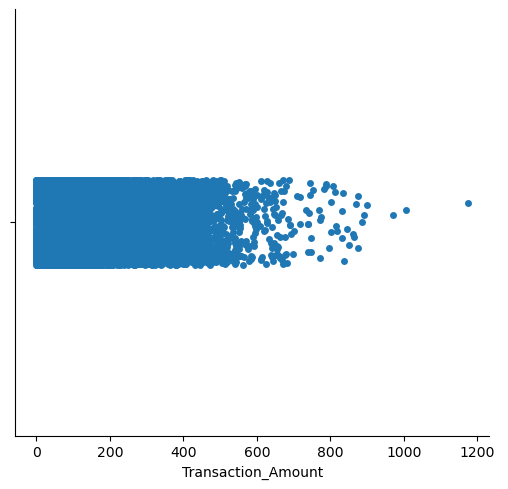

In [32]:
sns.catplot(x=df['Transaction_Amount'])
plt.show()

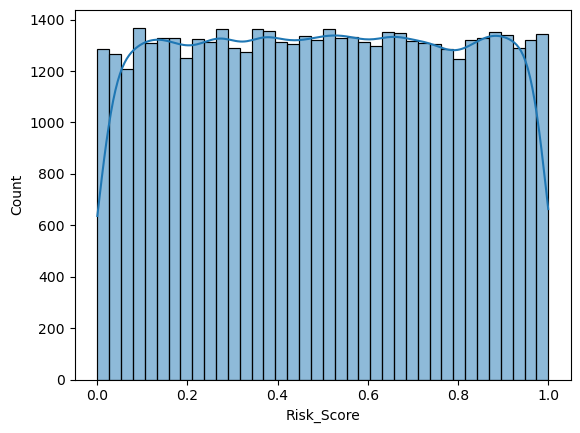

In [33]:
sns.histplot(x=df['Risk_Score'],kde=True)
plt.show()

### Encoding (Converting categorical data to numerical form )

In [34]:
df

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Timestamp,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,...,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
0,TXN_33553,USER_1834,39.79,POS,2023-08-14 19:30:00,93213.17,Laptop,Sydney,Travel,0,...,7,437.63,3,Amex,65,883.17,Biometric,0.8494,0,0
1,TXN_9427,USER_7875,1.19,Bank Transfer,2023-06-07 04:01:00,75725.25,Mobile,New York,Clothing,0,...,13,478.76,4,Mastercard,186,2203.36,Password,0.0959,0,1
2,TXN_199,USER_2734,28.96,Online,2023-06-20 15:25:00,1588.96,Tablet,Mumbai,Restaurants,0,...,14,50.01,4,Visa,226,1909.29,Biometric,0.8400,0,1
3,TXN_12447,USER_2617,254.32,ATM Withdrawal,2023-12-07 00:31:00,76807.20,Tablet,New York,Clothing,0,...,8,182.48,4,Visa,76,1311.86,OTP,0.7935,0,1
4,TXN_39489,USER_2014,31.28,POS,2023-11-11 23:44:00,92354.66,Mobile,Mumbai,Electronics,0,...,14,328.69,4,Mastercard,140,966.98,Password,0.3819,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,TXN_11284,USER_4796,45.05,Online,2023-01-29 18:38:00,76960.11,Mobile,Tokyo,Clothing,0,...,2,389.00,3,Amex,98,1537.54,PIN,0.1493,1,0
49996,TXN_44732,USER_1171,126.15,POS,2023-05-09 08:55:00,28791.75,Mobile,Tokyo,Clothing,0,...,13,434.95,4,Visa,93,2555.72,Biometric,0.3653,0,1
49997,TXN_38158,USER_2510,72.02,Online,2023-01-30 19:32:00,29916.41,Laptop,Mumbai,Clothing,0,...,1,369.15,2,Visa,114,4686.59,Biometric,0.5195,0,0
49998,TXN_860,USER_2248,64.89,Bank Transfer,2023-03-09 19:47:00,67895.67,Mobile,Tokyo,Electronics,0,...,13,242.29,4,Discover,72,4886.92,Biometric,0.7063,0,1


In [35]:
cat_data

,Transaction_ID,User_ID,Transaction_Type,Timestamp,Device_Type,Location,Merchant_Category,Card_Type,Authentication_Method
0,TXN_33553,USER_1834,POS,2023-08-14 19:30:00,Laptop,Sydney,Travel,Amex,Biometric
1,TXN_9427,USER_7875,Bank Transfer,2023-06-07 04:01:00,Mobile,New York,Clothing,Mastercard,Password
2,TXN_199,USER_2734,Online,2023-06-20 15:25:00,Tablet,Mumbai,Restaurants,Visa,Biometric
3,TXN_12447,USER_2617,ATM Withdrawal,2023-12-07 00:31:00,Tablet,New York,Clothing,Visa,OTP
4,TXN_39489,USER_2014,POS,2023-11-11 23:44:00,Mobile,Mumbai,Electronics,Mastercard,Password
...,...,...,...,...,...,...,...,...,...
49995,TXN_11284,USER_4796,Online,2023-01-29 18:38:00,Mobile,Tokyo,Clothing,Amex,PIN
49996,TXN_44732,USER_1171,POS,2023-05-09 08:55:00,Mobile,Tokyo,Clothing,Visa,Biometric
49997,TXN_38158,USER_2510,Online,2023-01-30 19:32:00,Laptop,Mumbai,Clothing,Visa,Biometric
49998,TXN_860,USER_2248,Bank Transfer,2023-03-09 19:47:00,Mobile,Tokyo,Electronics,Discover,Biometric


In [36]:
## Encoding Transaction_Type

from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df.Transaction_Type=label.fit_transform(df.Transaction_Type)

In [37]:
## Encoding Device_Type

from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df.Device_Type=label.fit_transform(df.Device_Type)

In [38]:
## Encoding Location

from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df.Location=label.fit_transform(df.Location)

In [39]:
## Encoding Merchant_Category

from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df.Merchant_Category=label.fit_transform(df.Merchant_Category)

In [40]:
## Encoding Card_Type

from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df.Card_Type=label.fit_transform(df.Card_Type)

In [41]:
## Encoding Authentication_Method

from sklearn.preprocessing import LabelEncoder

label = LabelEncoder()
df.Authentication_Method=label.fit_transform(df.Authentication_Method)

In [42]:
df

,Transaction_ID,User_ID,Transaction_Amount,Transaction_Type,Timestamp,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,...,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
0,TXN_33553,USER_1834,39.79,3,2023-08-14 19:30:00,93213.17,0,3,4,0,...,7,437.63,3,0,65,883.17,0,0.8494,0,0
1,TXN_9427,USER_7875,1.19,1,2023-06-07 04:01:00,75725.25,1,2,0,0,...,13,478.76,4,2,186,2203.36,3,0.0959,0,1
2,TXN_199,USER_2734,28.96,2,2023-06-20 15:25:00,1588.96,2,1,3,0,...,14,50.01,4,3,226,1909.29,0,0.8400,0,1
3,TXN_12447,USER_2617,254.32,0,2023-12-07 00:31:00,76807.20,2,2,0,0,...,8,182.48,4,3,76,1311.86,1,0.7935,0,1
4,TXN_39489,USER_2014,31.28,3,2023-11-11 23:44:00,92354.66,1,1,1,0,...,14,328.69,4,2,140,966.98,3,0.3819,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,TXN_11284,USER_4796,45.05,2,2023-01-29 18:38:00,76960.11,1,4,0,0,...,2,389.00,3,0,98,1537.54,2,0.1493,1,0
49996,TXN_44732,USER_1171,126.15,3,2023-05-09 08:55:00,28791.75,1,4,0,0,...,13,434.95,4,3,93,2555.72,0,0.3653,0,1
49997,TXN_38158,USER_2510,72.02,2,2023-01-30 19:32:00,29916.41,0,1,0,0,...,1,369.15,2,3,114,4686.59,0,0.5195,0,0
49998,TXN_860,USER_2248,64.89,1,2023-03-09 19:47:00,67895.67,1,4,1,0,...,13,242.29,4,1,72,4886.92,0,0.7063,0,1


## Dropping unnecessary columns 

In [43]:
df.drop(['Transaction_ID','User_ID','Timestamp'], axis="columns", inplace=True)

In [44]:
df

,Transaction_Amount,Transaction_Type,Account_Balance,Device_Type,Location,Merchant_Category,IP_Address_Flag,Previous_Fraudulent_Activity,Daily_Transaction_Count,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Card_Type,Card_Age,Transaction_Distance,Authentication_Method,Risk_Score,Is_Weekend,Fraud_Label
0,39.79,3,93213.17,0,3,4,0,0,7,437.63,3,0,65,883.17,0,0.8494,0,0
1,1.19,1,75725.25,1,2,0,0,0,13,478.76,4,2,186,2203.36,3,0.0959,0,1
2,28.96,2,1588.96,2,1,3,0,0,14,50.01,4,3,226,1909.29,0,0.8400,0,1
3,254.32,0,76807.20,2,2,0,0,0,8,182.48,4,3,76,1311.86,1,0.7935,0,1
4,31.28,3,92354.66,1,1,1,0,1,14,328.69,4,2,140,966.98,3,0.3819,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,45.05,2,76960.11,1,4,0,0,0,2,389.00,3,0,98,1537.54,2,0.1493,1,0
49996,126.15,3,28791.75,1,4,0,0,0,13,434.95,4,3,93,2555.72,0,0.3653,0,1
49997,72.02,2,29916.41,0,1,0,0,1,1,369.15,2,3,114,4686.59,0,0.5195,0,0
49998,64.89,1,67895.67,1,4,1,0,0,13,242.29,4,1,72,4886.92,0,0.7063,0,1


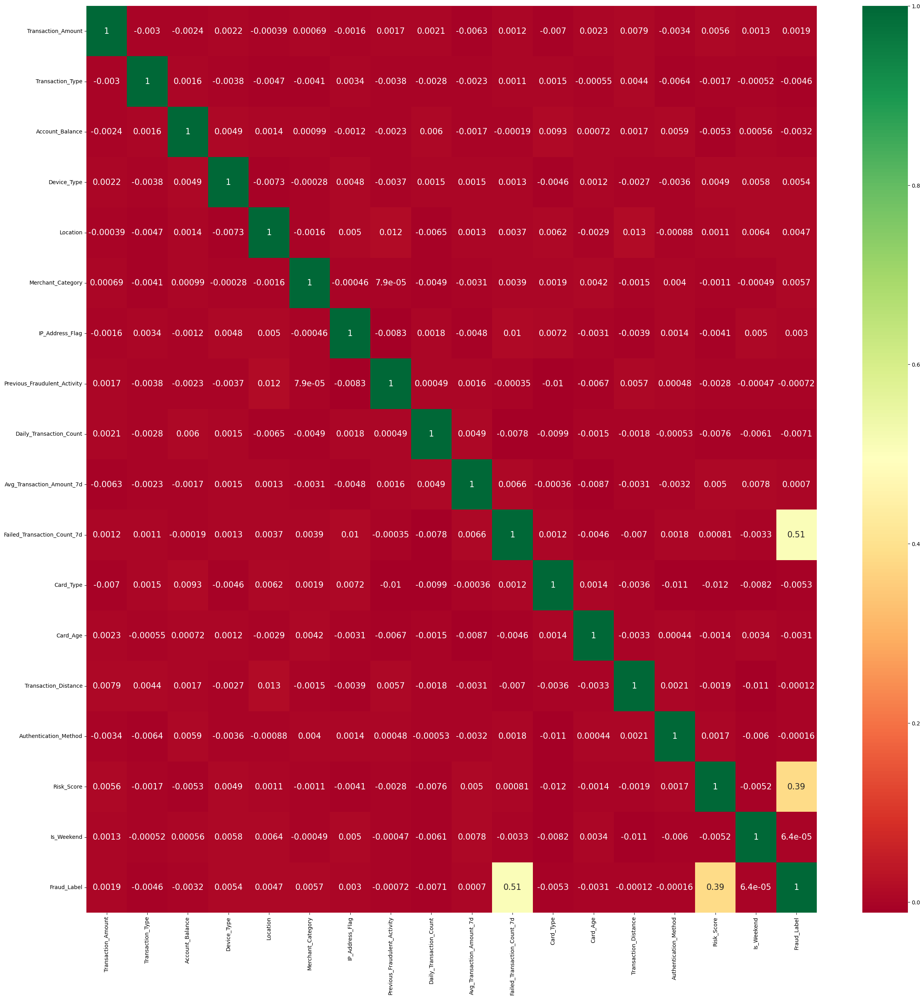

In [45]:

plt.figure(figsize=(30, 30))#canvas size
sns.heatmap(df.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})
plt.show()

## Model Creation 

In [61]:
## Split the data into x and y 
x = df[['Transaction_Amount','Device_Type','Location','Merchant_Category','IP_Address_Flag','Avg_Transaction_Amount_7d','Failed_Transaction_Count_7d','Authentication_Method','Risk_Score']]
y = df.Fraud_Label

In [62]:
## training and testing data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

In [63]:
x_train

,Transaction_Amount,Device_Type,Location,Merchant_Category,IP_Address_Flag,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Authentication_Method,Risk_Score
39087,80.39,2,0,4,0,112.75,4,2,0.3668
30893,196.60,1,2,1,0,199.95,1,1,0.4866
45278,21.88,2,3,1,0,234.75,2,1,0.2961
16398,121.23,1,0,4,0,344.98,2,2,0.3362
13653,34.53,1,3,2,0,456.77,1,3,0.0804
...,...,...,...,...,...,...,...,...,...
11284,41.10,2,3,4,0,449.96,1,2,0.0872
44732,3.06,0,3,4,0,392.70,4,0,0.5109
38158,98.54,2,4,2,0,116.87,0,1,0.7671
860,196.83,0,0,2,1,162.36,1,3,0.9580


In [64]:
x_test

,Transaction_Amount,Device_Type,Location,Merchant_Category,IP_Address_Flag,Avg_Transaction_Amount_7d,Failed_Transaction_Count_7d,Authentication_Method,Risk_Score
33553,19.98,1,3,0,0,350.41,3,1,0.6865
9427,45.32,1,2,4,0,47.14,1,3,0.5322
199,32.25,0,4,3,0,160.14,2,3,0.4924
12447,35.41,2,1,4,0,340.38,4,1,0.5503
39489,57.80,2,3,2,1,149.80,0,0,0.2208
...,...,...,...,...,...,...,...,...,...
28567,4.91,1,2,1,0,280.21,1,1,0.5347
25079,9.76,2,2,3,0,214.04,2,1,0.6408
18707,158.17,0,1,1,0,34.96,0,2,0.2301
15200,303.56,2,1,1,0,192.22,3,1,0.1050


In [65]:
y_train

39087    1
30893    0
45278    0
16398    0
13653    0
        ..
11284    0
44732    1
38158    0
860      1
15795    0
Name: Fraud_Label, Length: 40000, dtype: int64

In [66]:
y_test

33553    0
9427     0
199      0
12447    1
39489    0
        ..
28567    0
25079    0
18707    0
15200    0
5857     1
Name: Fraud_Label, Length: 10000, dtype: int64

In [67]:
## Balacing the data
from collections import Counter
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x_smote,y_smote=sm.fit_resample(x_train,y_train)

In [68]:
print("actual",Counter(y_train))
print("after smote",Counter(y_smote))

actual Counter({0: 27168, 1: 12832})
after smote Counter({1: 27168, 0: 27168})


# Logistic Regression

In [69]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

logistic_regression_model = LogisticRegression()
logistic_regression_model.fit(x_smote, y_smote)

logistic_regression_pred = logistic_regression_model.predict(x_test)

conf_matrix = confusion_matrix(y_test, logistic_regression_pred)
print("Confusion Matrix:")
print(conf_matrix)

accuracy = accuracy_score(y_test, logistic_regression_pred)
print("Accuracy:", accuracy)

precision = precision_score(y_test, logistic_regression_pred)
print("Precision:", precision)

recall = recall_score(y_test, logistic_regression_pred)
print("Recall:", recall)

f1 = f1_score(y_test, logistic_regression_pred)
print("F1 Score:", f1)


Confusion Matrix:
[[5056 1709]
 [ 700 2535]]
Accuracy: 0.7591
Precision: 0.5973138548539114
Recall: 0.7836166924265843
F1 Score: 0.6778981147212194


# Random Forest

In [70]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

random_forest_model = RandomForestClassifier()
random_forest_model.fit(x_smote, y_smote)

random_forest_pred = random_forest_model.predict(x_test)

conf_matrix = confusion_matrix(y_test, random_forest_pred)
print("Confusion Matrix:")
print(conf_matrix)

accuracy = accuracy_score(y_test, random_forest_pred)
print("Accuracy:", accuracy)

precision = precision_score(y_test, random_forest_pred)
print("Precision:", precision)

recall = recall_score(y_test, random_forest_pred)
print("Recall:", recall)

f1 = f1_score(y_test, random_forest_pred)
print("F1 Score:", f1)


Confusion Matrix:
[[6542  223]
 [   0 3235]]
Accuracy: 0.9777
Precision: 0.9355118565644881
Recall: 1.0
F1 Score: 0.9666816076497834


# Gradient Boosting

In [71]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

gradient_boosting_model = GradientBoostingClassifier()
gradient_boosting_model.fit(x_smote, y_smote)

gradient_boosting_pred = gradient_boosting_model.predict(x_test)

conf_matrix = confusion_matrix(y_test, gradient_boosting_pred)
print("Confusion Matrix:")
print(conf_matrix)

accuracy = accuracy_score(y_test, gradient_boosting_pred)
print("Accuracy:", accuracy)

precision = precision_score(y_test, gradient_boosting_pred)
print("Precision:", precision)

recall = recall_score(y_test, gradient_boosting_pred)
print("Recall:", recall)

f1 = f1_score(y_test, gradient_boosting_pred)
print("F1 Score:", f1)


Confusion Matrix:
[[6576  189]
 [   0 3235]]
Accuracy: 0.9811
Precision: 0.9448014018691588
Recall: 1.0
F1 Score: 0.9716173599639586


# Decision Tree

In [72]:
from sklearn.tree import DecisionTreeClassifier
model=DecisionTreeClassifier() 
model.fit(x_smote,y_smote)
y_pred=model.predict(x_test)

In [73]:
y_train_predict=model.predict(x_train)#predicting training data to check training performance 
y_train_predict

array([1, 0, 0, ..., 0, 1, 0], dtype=int64)

In [76]:
# training accuracy
from sklearn.metrics import accuracy_score
accuracy_score(y_train,y_train_predict)


1.0

In [77]:
# testing accuracy
accuracy_score(y_test,y_pred)

0.9389